In [ ]:
#General modules
import numpy as np
import pandas as pd
from tqdm import *

#For plotting
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider, Button
import seaborn as sns

#For dealing with time string types
import datetime


#For building ML model
from sklearn.model_selection import train_test_split

#Different Regressors for ML model
from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel , RBF
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

#For model evaluation
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict

#For parameter grid search optimization
from sklearn.model_selection import GridSearchCV

#For saving model
import pickle

#For q-q plot
import scipy.stats as stats




In [ ]:
!wget https://raw.githubusercontent.com/nitinkardam/cl653/main/AirQuality.csv
df = pd.read_csv("/content/AirQuality.csv", sep = ";", decimal = ",")
df.head()

--2024-04-25 16:56:17--  https://raw.githubusercontent.com/nitinkardam/cl653/main/AirQuality.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 785065 (767K) [text/plain]
Saving to: ‘AirQuality.csv.3’

AirQuality.csv.3    100%[===================>] 766.67K  --.-KB/s    in 0.05s   

2024-04-25 16:56:17 (16.6 MB/s) - ‘AirQuality.csv.3’ saved [785065/785065]



,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN


In [ ]:
df.drop(['Unnamed: 15','Unnamed: 16'], axis=1, inplace=True, errors = 'ignore')
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
#Replacing bad sensor readings designated by an entry of -200 with NaN
df.replace(to_replace = -200, value = np.nan, inplace = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         7674 non-null   float64
 3   PT08.S1(CO)    8991 non-null   float64
 4   NMHC(GT)       914 non-null    float64
 5   C6H6(GT)       8991 non-null   float64
 6   PT08.S2(NMHC)  8991 non-null   float64
 7   NOx(GT)        7718 non-null   float64
 8   PT08.S3(NOx)   8991 non-null   float64
 9   NO2(GT)        7715 non-null   float64
 10  PT08.S4(NO2)   8991 non-null   float64
 11  PT08.S5(O3)    8991 non-null   float64
 12  T              8991 non-null   float64
 13  RH             8991 non-null   float64
 14  AH             8991 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1.1+ MB


In [ ]:
percent_NaN = []
columns = df.columns
for col in columns:
    pNaN =  (df[col].isna().sum()/df.shape[0]) * 100 #sum NaN instances in each column. Divide by total rows
    percent_NaN.append(pNaN)
nan_percent_df = pd.DataFrame(percent_NaN,
                              index=columns,
                              columns=['%_NaN_in_Column']).sort_values('%_NaN_in_Column',ascending = False)
nan_percent_df

,%_NaN_in_Column
NMHC(GT),90.349488
CO(GT),18.973709
NO2(GT),18.540809
NOx(GT),18.509133
PT08.S1(CO),5.068103
C6H6(GT),5.068103
PT08.S2(NMHC),5.068103
PT08.S3(NOx),5.068103
PT08.S4(NO2),5.068103
PT08.S5(O3),5.068103


In [ ]:
df.drop('NMHC(GT)', axis=1, inplace=True, errors = 'ignore')
df = df.dropna()
df.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6941 entries, 0 to 9356
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           6941 non-null   object 
 1   Time           6941 non-null   object 
 2   CO(GT)         6941 non-null   float64
 3   PT08.S1(CO)    6941 non-null   float64
 4   C6H6(GT)       6941 non-null   float64
 5   PT08.S2(NMHC)  6941 non-null   float64
 6   NOx(GT)        6941 non-null   float64
 7   PT08.S3(NOx)   6941 non-null   float64
 8   NO2(GT)        6941 non-null   float64
 9   PT08.S4(NO2)   6941 non-null   float64
 10  PT08.S5(O3)    6941 non-null   float64
 11  T              6941 non-null   float64
 12  RH             6941 non-null   float64
 13  AH             6941 non-null   float64
dtypes: float64(12), object(2)
memory usage: 813.4+ KB


In [ ]:
df['DateTime'] =  (df.Date) + ' ' + (df.Time)
df.DateTime = df.DateTime.apply(lambda x: datetime.datetime.strptime(x, '%d/%m/%Y %H.%M.%S'))
df

<ipython-input-24-3bb1999f12b7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['DateTime'] =  (df.Date) + ' ' + (df.Time)


,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
0,10/03/2004,18.00.00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,2004-03-10 18:00:00
1,10/03/2004,19.00.00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,2004-03-10 19:00:00
2,10/03/2004,20.00.00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,2004-03-10 20:00:00
3,10/03/2004,21.00.00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,2004-03-10 21:00:00
4,10/03/2004,22.00.00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,2004-03-10 22:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10.00.00,3.1,1314.0,13.5,1101.0,472.0,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568,2005-04-04 10:00:00
9353,04/04/2005,11.00.00,2.4,1163.0,11.4,1027.0,353.0,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119,2005-04-04 11:00:00
9354,04/04/2005,12.00.00,2.4,1142.0,12.4,1063.0,293.0,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406,2005-04-04 12:00:00
9355,04/04/2005,13.00.00,2.1,1003.0,9.5,961.0,235.0,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139,2005-04-04 13:00:00


In [ ]:
df['Weekday'] = df['DateTime'].dt.day_name()
df['Month']   = df['DateTime'].dt.month_name()
df['Hour']    = df['DateTime'].dt.hour
df['Date']    = pd.to_datetime(df['Date'], format='%d/%m/%Y')
df.drop('Time', axis=1, inplace=True, errors = 'ignore')
df.head()

,Date,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime,Weekday,Month,Hour
0,2004-03-10,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,2004-03-10 18:00:00,Wednesday,March,18
1,2004-03-10,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,2004-03-10 19:00:00,Wednesday,March,19
2,2004-03-10,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,2004-03-10 20:00:00,Wednesday,March,20
3,2004-03-10,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,2004-03-10 21:00:00,Wednesday,March,21
4,2004-03-10,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,2004-03-10 22:00:00,Wednesday,March,22


In [ ]:
df = df[['Date','Month', 'Weekday','DateTime', 'Hour', 'CO(GT)','PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
         'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']]
df.head()

,Date,Month,Weekday,DateTime,Hour,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,March,Wednesday,2004-03-10 18:00:00,18,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,March,Wednesday,2004-03-10 19:00:00,19,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,March,Wednesday,2004-03-10 20:00:00,20,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,March,Wednesday,2004-03-10 21:00:00,21,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,March,Wednesday,2004-03-10 22:00:00,22,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6941 entries, 0 to 9356
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           6941 non-null   datetime64[ns]
 1   Month          6941 non-null   object        
 2   Weekday        6941 non-null   object        
 3   DateTime       6941 non-null   datetime64[ns]
 4   Hour           6941 non-null   int32         
 5   CO(GT)         6941 non-null   float64       
 6   PT08.S1(CO)    6941 non-null   float64       
 7   C6H6(GT)       6941 non-null   float64       
 8   PT08.S2(NMHC)  6941 non-null   float64       
 9   NOx(GT)        6941 non-null   float64       
 10  PT08.S3(NOx)   6941 non-null   float64       
 11  NO2(GT)        6941 non-null   float64       
 12  PT08.S4(NO2)   6941 non-null   float64       
 13  PT08.S5(O3)    6941 non-null   float64       
 14  T              6941 non-null   float64       
 15  RH             6941 non-nu

In [ ]:
#Removing Outliers with the Interquartile Range Method (IQR)
Q1 = df.quantile(0.25, numeric_only=True)  # First quartile (25%)
Q3 = df.quantile(0.75, numeric_only=True)  # Third quartile (75%)


IQR = Q3 - Q1 #IQR = InterQuartile Range

scale = 1.4 #May need to play with this value to modify outlier detection sensitivity if need be
lower_lim = Q1 - scale*IQR
upper_lim = Q3 + scale*IQR

cols = df.columns[5:]  # Look for outliers in columns starting from CO(GT)

# Align lower_lim and upper_lim with the DataFrame columns
lower_lim = lower_lim[cols]
upper_lim = upper_lim[cols]

# Mask a condition that removes rows with values above/below IQR limits
condition = ~((df[cols] < lower_lim) | (df[cols] > upper_lim)).any(axis=1)

# Generate a new DataFrame with outliers removed
df_filtered = df[condition]

In [ ]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6099 entries, 0 to 9356
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           6099 non-null   datetime64[ns]
 1   Month          6099 non-null   object        
 2   Weekday        6099 non-null   object        
 3   DateTime       6099 non-null   datetime64[ns]
 4   Hour           6099 non-null   int32         
 5   CO(GT)         6099 non-null   float64       
 6   PT08.S1(CO)    6099 non-null   float64       
 7   C6H6(GT)       6099 non-null   float64       
 8   PT08.S2(NMHC)  6099 non-null   float64       
 9   NOx(GT)        6099 non-null   float64       
 10  PT08.S3(NOx)   6099 non-null   float64       
 11  NO2(GT)        6099 non-null   float64       
 12  PT08.S4(NO2)   6099 non-null   float64       
 13  PT08.S5(O3)    6099 non-null   float64       
 14  T              6099 non-null   float64       
 15  RH             6099 non-nu

In [ ]:
df_filtered.drop(['CO(GT)']  ,axis=1, inplace=True, errors = 'ignore')
df_filtered.drop(['NOx(GT)'] ,axis=1, inplace=True, errors = 'ignore')
df_filtered.drop(['C6H6(GT)'],axis=1, inplace=True, errors = 'ignore')
df_filtered.drop(['NO2(GT)'] ,axis=1, inplace=True, errors = 'ignore')
df_filtered.head()

<ipython-input-30-cb50782a70c7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.drop(['CO(GT)']  ,axis=1, inplace=True, errors = 'ignore')
<ipython-input-30-cb50782a70c7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.drop(['NOx(GT)'] ,axis=1, inplace=True, errors = 'ignore')
<ipython-input-30-cb50782a70c7>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered.drop(['C6H6(GT)'],axis=1, inplace=True, er

,Date,Month,Weekday,DateTime,Hour,PT08.S1(CO),PT08.S2(NMHC),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,March,Wednesday,2004-03-10 18:00:00,18,1360.0,1046.0,1056.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,March,Wednesday,2004-03-10 19:00:00,19,1292.0,955.0,1174.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,March,Wednesday,2004-03-10 20:00:00,20,1402.0,939.0,1140.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,March,Wednesday,2004-03-10 21:00:00,21,1376.0,948.0,1092.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,March,Wednesday,2004-03-10 22:00:00,22,1272.0,836.0,1205.0,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
month_df_list = []
day_df_list   = []
hour_df_list  = []

months = ['January','February','March', 'April', 'May','June',
          'July', 'August', 'September', 'October', 'November', 'December']

days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for month in months:
    temp_df = df_filtered.loc[(df_filtered['Month'] == month)]
    month_df_list.append(temp_df)

for day in days:
    temp_df = df_filtered.loc[(df_filtered['Weekday'] == day)]
    day_df_list.append(temp_df)

for hour in range(24):
    temp_df = df_filtered.loc[(df_filtered['Hour'] == hour)]
    hour_df_list.append(temp_df)

In [ ]:
def df_time_plotter(df_list, time_unit, y_col):

    months = ['January','February','March', 'April', 'May','June',
              'July', 'August', 'September', 'October', 'November', 'December']

    days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

    if time_unit == 'M':
        nRows = 3
        nCols = 4
        n_iter = len(months)
    elif time_unit == 'D':
        nRows = 2
        nCols = 4
        n_iter = len(days)
    elif time_unit == 'H':
        nRows = 4
        nCols = 6
        n_iter = 24
    else:
        print('time_unit must be a string equal to M,D, or H')
        return 0

    fig, axs = plt.subplots(nrows=nRows, ncols=nCols, figsize = (40,30))
    axs = axs.ravel()
    for i in range(n_iter):
        data = df_list[i]
        ax = axs[i]
        data.plot(kind ='scatter', x = 'DateTime', y= y_col , ax = ax, fontsize = 24)
        ax.set_ylabel('Pollutant Concentration',fontsize=30)
        ax.set_xlabel('')
        if time_unit == 'M':
            ax.set_title(y_col + ' ' + months[i],  size=40) # Title
        elif time_unit == 'D':
            ax.set_title(y_col + ' ' + days[i],  size=40) # Title
        else:
             ax.set_title(y_col + ' ' + str(i),  size=40) # Title
        ax.tick_params(labelrotation=60)

        #plt.xlim([datetime.date(2004, 3, 10), datetime.date(2004, 3, 30)])
    # set the spacing between subplots
    plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.5)
    plt.show()

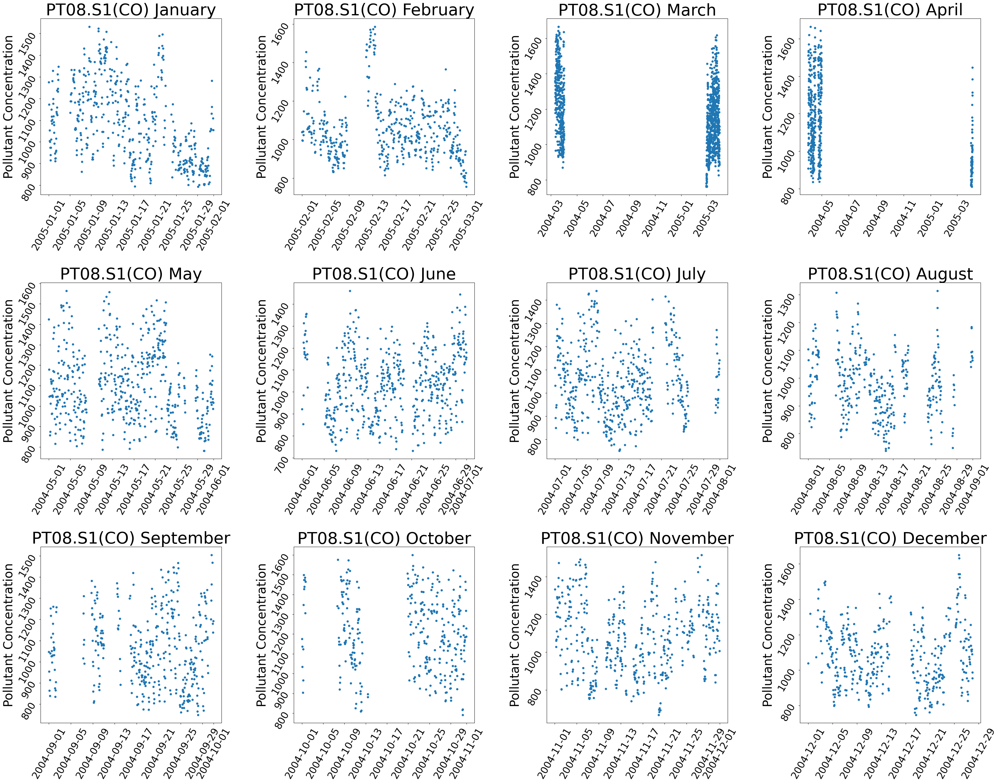

In [ ]:
df_time_plotter(month_df_list,'M','PT08.S1(CO)')

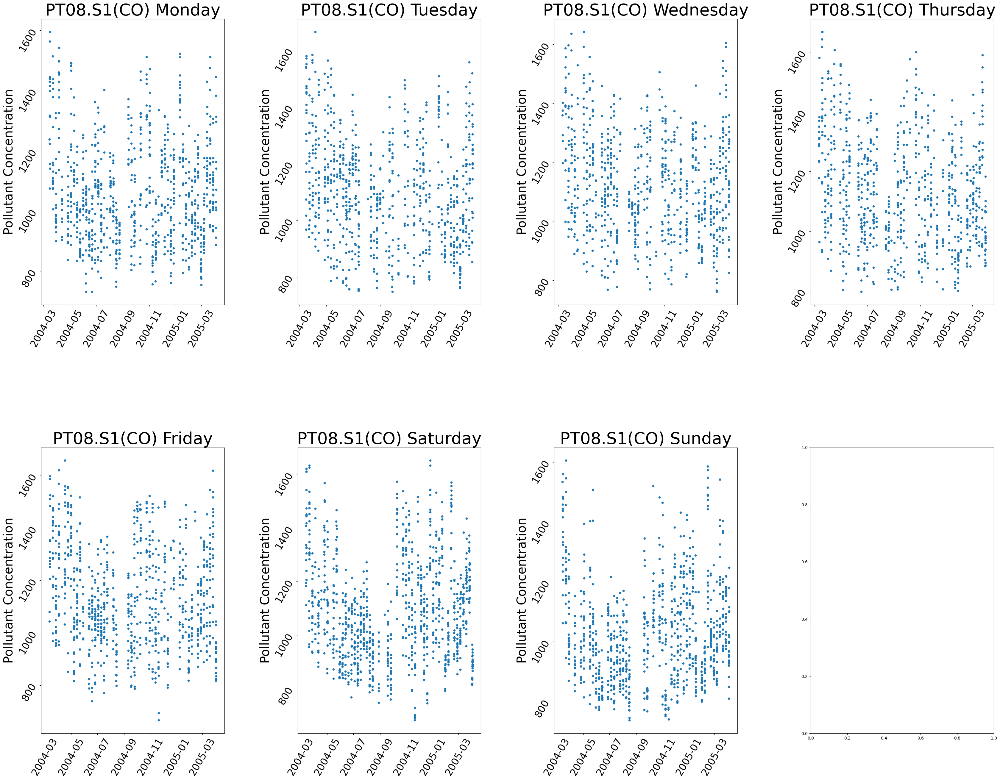

In [ ]:
df_time_plotter(day_df_list,'D','PT08.S1(CO)')

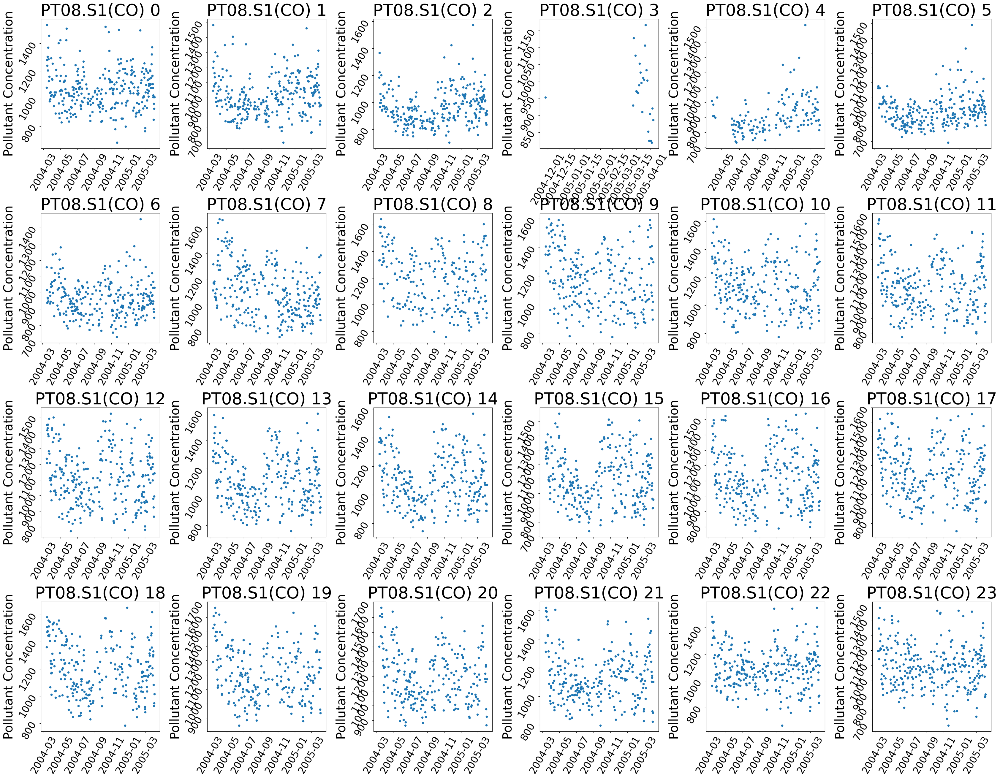

In [ ]:
df_time_plotter(hour_df_list,'H','PT08.S1(CO)')

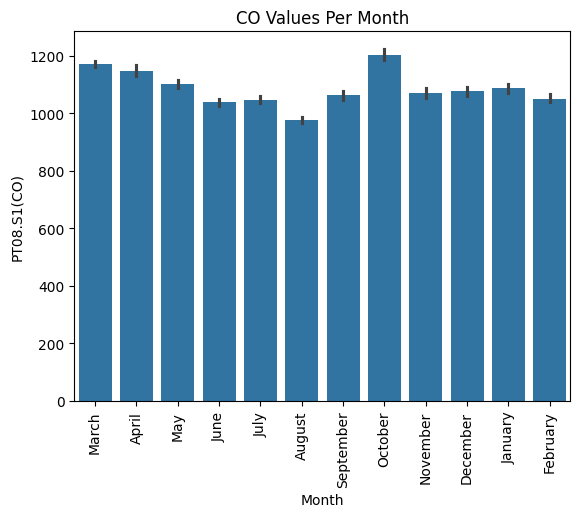

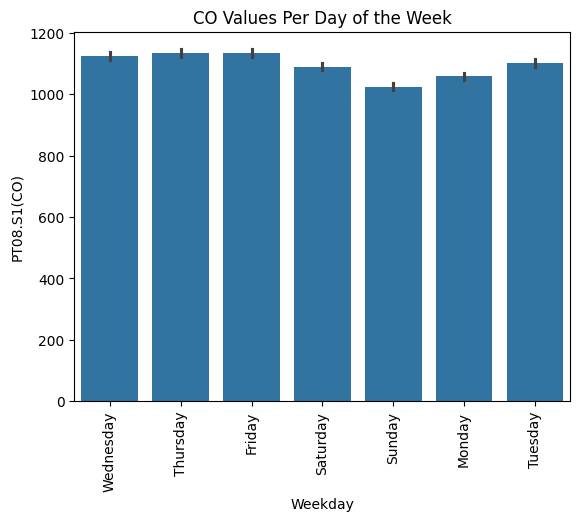

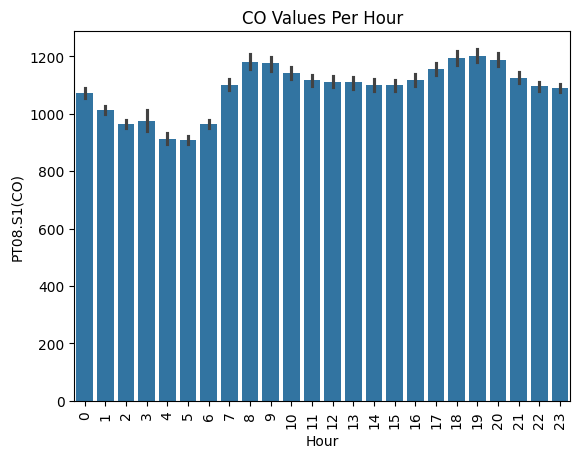

In [ ]:
sns.barplot(x = 'Month', y = 'PT08.S1(CO)', data = df_filtered)
plt.title('CO Values Per Month')
plt.xticks(rotation=90)
plt.show()

sns.barplot(x = 'Weekday', y = 'PT08.S1(CO)', data = df_filtered)
plt.title('CO Values Per Day of the Week')
plt.xticks(rotation=90)
plt.show()

sns.barplot(x = 'Hour', y = 'PT08.S1(CO)', data = df_filtered)
plt.title('CO Values Per Hour')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df_final = df_filtered.iloc[:, 5:]
df_final

,PT08.S1(CO),PT08.S2(NMHC),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,1360.0,1046.0,1056.0,1692.0,1268.0,13.6,48.9,0.7578
1,1292.0,955.0,1174.0,1559.0,972.0,13.3,47.7,0.7255
2,1402.0,939.0,1140.0,1555.0,1074.0,11.9,54.0,0.7502
3,1376.0,948.0,1092.0,1584.0,1203.0,11.0,60.0,0.7867
4,1272.0,836.0,1205.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...
9352,1314.0,1101.0,539.0,1374.0,1729.0,21.9,29.3,0.7568
9353,1163.0,1027.0,604.0,1264.0,1269.0,24.3,23.7,0.7119
9354,1142.0,1063.0,603.0,1241.0,1092.0,26.9,18.3,0.6406
9355,1003.0,961.0,702.0,1041.0,770.0,28.3,13.5,0.5139


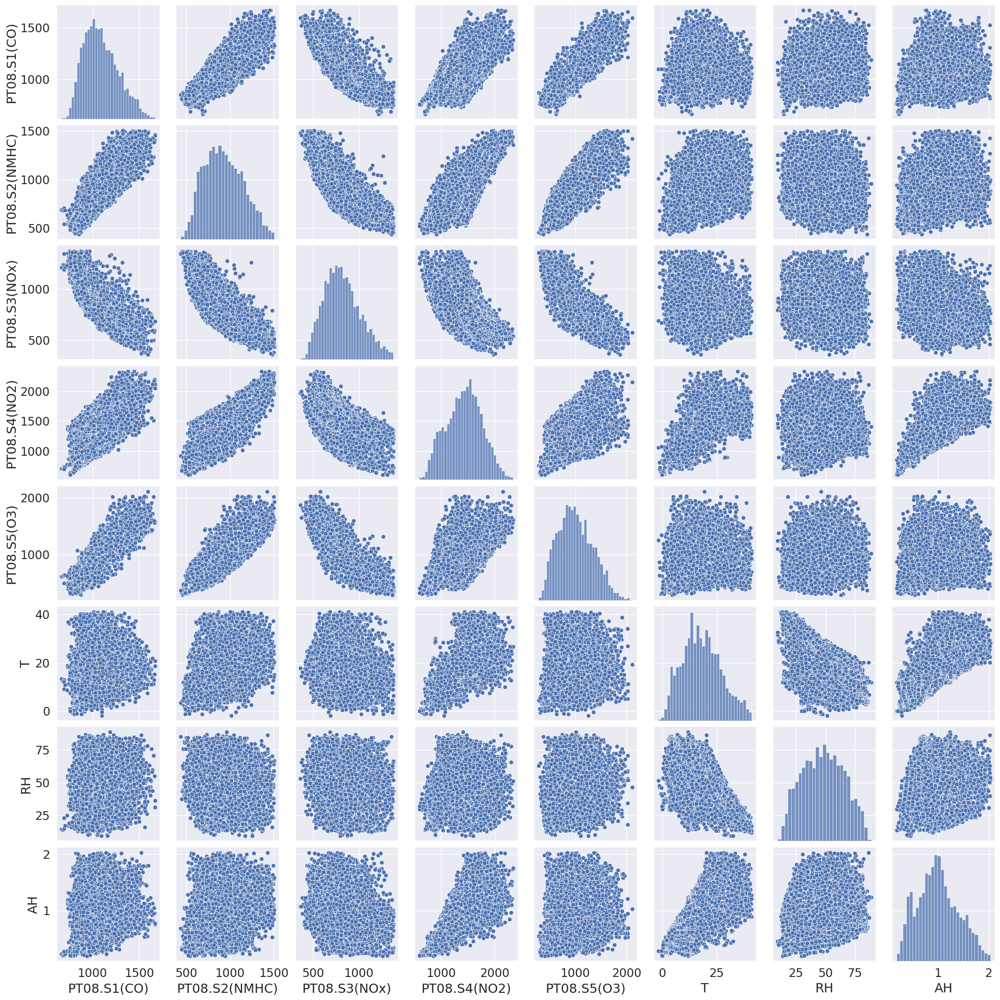

In [ ]:
sns.set(font_scale=1.5)
sns.pairplot(df_final)

In [ ]:
def model_assess(X_train, X_test, y_train, y_test, model, title = "Default"):

    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)

    train_mse = mean_squared_error(y_train, y_train_pred)
    train_r2 = r2_score(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_r2 = r2_score(y_test, y_test_pred)

    results = pd.DataFrame([title,train_mse, train_r2, test_mse, test_r2]).transpose()
    results.columns = ['Method','Training MSE','Training R2','Test MSE','Test R2']
    return y_train_pred,y_test_pred, results

def multi_model_assess(df, models, y_predict):
    all_model_results = [] #This will contain all model results for each dependent variable
    all_X_test  = []
    all_X_train = []
    all_y_test_p  = []
    all_y_train_p = []
    all_y_train = []
    #First loop will define dependent/independent variables and split data into test/training sets
    n_vars = len(y_predict)
    pbar = tqdm(range(n_vars), desc="Variable Processed", position = 0, leave = True)#Add progress bar

    for dependent in y_predict:
        model_results = [] #Array with dataframes for a given dependent variable
        #Designate independent and dependent variables
        x  = df.drop([dependent], axis = 1)
        y  = df[dependent]
        #Split data into test and training sets
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

        #Populate the array of observed values for the dependent variable
        all_y_train.append(y_train)

        #Process each of the desired models
        for model, model_name in models:
            y_train_pred,y_test_pred, results = model_assess(X_train, X_test, y_train, y_test,
                                                             model, title = model_name)

            model_results.append(results)
            all_X_test.append(X_test)
            all_X_train.append(X_train)
            all_y_test_p.append(y_test_pred)
            all_y_train_p.append(y_train_pred)

        all_model_results.append(model_results)
        pbar.update(1)
        pbar.refresh()

    pbar.close()
    return all_model_results, all_X_test, all_X_train, all_y_test_p, all_y_train_p, all_y_train

In [ ]:
#Initiate Different Regressors for ML model
lr = LinearRegression()
hr = HuberRegressor(epsilon=1.15, max_iter=1000)
rf = RandomForestRegressor(n_estimators=100, max_depth=3, random_state=42)
gb = GradientBoostingRegressor(n_estimators=100, max_depth=3, random_state=42)
gp = GaussianProcessRegressor(kernel = DotProduct() + WhiteKernel(), random_state=42)
kn = KNeighborsRegressor()
ab = AdaBoostRegressor()
sv = SVR()
dt = DecisionTreeRegressor(max_features = 'auto', max_depth=3, random_state=42)
nn = MLPRegressor(hidden_layer_sizes = 500, solver='adam', learning_rate_init = 1e-2,max_iter=500)

models =  [(lr,'Linear Regression'),
           (hr,'Huber Regression'),
           (rf,'Random Forest'),
           (gb,'Gradient Boosting'),
           (gp,'Gaussian Process'),
           (kn,'K-Neighbors'),
           (ab,'Ada Boost'),
           (sv,'SVR'),
           (dt,'Decision Tree'),
           (nn,'MLP')]

y_predict  = ['PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)']

all_model_results, _, _, all_y_test_p, all_y_train_p, all_y_train = multi_model_assess(df_final,models, y_predict)

Variable Processed:   0%|          | 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
Variable Processed:  20%|██        | 1/5 [05:22<21:28, 322.23s/it]/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
Variable Processed:  40%|████      | 2/5 [11:00<16:34, 331.55s/it]/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
Variable Processed:  60%|██████    | 3/5 [16:15<10:48, 324.15s/it]/usr/local/lib/p

In [ ]:
score_df_results = pd.concat(all_model_results[0],
                        ignore_index=True).sort_values('Test R2',axis = 0, ascending = False)
score_df_results

,Method,Training MSE,Training R2,Test MSE,Test R2
3,Gradient Boosting,2975.862799,0.909353,3976.0849,0.885359
5,K-Neighbors,2611.867383,0.92044,4088.343705,0.882122
0,Linear Regression,5613.514349,0.829008,5698.548012,0.835696
1,Huber Regression,5666.802038,0.827385,5772.695689,0.833558
6,Ada Boost,5819.029267,0.822748,6067.781638,0.82505
4,Gaussian Process,5865.03086,0.821346,6078.907944,0.824729
2,Random Forest,6753.178425,0.794293,7355.771574,0.787914
7,SVR,7165.926266,0.78172,7616.963169,0.780383
8,Decision Tree,7491.596464,0.7718,8147.199259,0.765095
9,MLP,7876.367533,0.760079,8154.093872,0.764896


In [ ]:
score_results_test = pd.concat(all_model_results[0], ignore_index=True)
score_results_test['Test R2'][0]

0.8356960503616119

In [ ]:
#Define column with model to predict
y_predict  = ['PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)']

#Model names for plot titles
models =  [(lr,'Linear Regression'),
           (hr,'Huber Regression'),
           (rf,'Random Forest'),
           (gb,'Gradient Boosting'),
           (gp,'Gaussian Process'),
           (kn,'K Neighbors'),
           (ab,'Ada Boost'),
           (sv,'SVR'),
           (dt,'Decision Tree'),
           (nn,'MLP')]

#Make labels
def make_labels(models):
    names = []
    for i in range(len(models)):
        if len(models[i][1].split()) < 2:
            names.append(models[i][1])
        else:
            names.append(''.join([s[0] for s in models[i][1].split()]))
    return names
labelList = make_labels(models)

#Specify color map to color different plots
cmap = plt.cm.get_cmap('plasma')
slicedCM = cmap(np.linspace(0, 1, len(models)))

#Visualize results of linear regression
plt.rcParams.update({'font.size': 20})
nRows = 5 #
nCols = 2 #

def plot_ML_model(whichVar):
    fig, axs = plt.subplots(nrows=nRows, ncols=nCols, figsize = (15,30))
    axs = axs.ravel()
    df    = pd.concat(all_model_results[whichVar], ignore_index=True)
    for k in range(10):
        color = slicedCM[k]
        yPred = all_y_train_p[k + whichVar*len(models)]
        yMeas = all_y_train[whichVar]
        label = labelList[k]
        ax    = axs[k]
        #Make scatter plot of train set and regressor model
        ax.scatter(x = yMeas, y = yPred, color=color, alpha=0.5)

        #Fit a first order polynomial (i.e. a straight line) to the regressor model
        z = np.polyfit(yMeas, yPred, 1)
        p = np.poly1d(z)

        #Add labels and colors and stuff
        val = df['Test R2'][k] #Get the r2 value from the model results dataframe
        val = "{:.2f}".format(val)
        ax.plot(yMeas,p(yMeas),"#b20cd7", label=label+"\nr\u00b2".format(2) + " = " + str(val))
        ax.title.set_text(models[k][1])
        ax.set(xlabel='Train Concentration', ylabel='Predicted Concentration')
        ax.label_outer()
        ax.legend(loc="upper left")
        ax.grid(color = 'black', linestyle = '--', linewidth = 0.5)
    plt.show()

<ipython-input-43-f8c0d27eb760>:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('plasma')


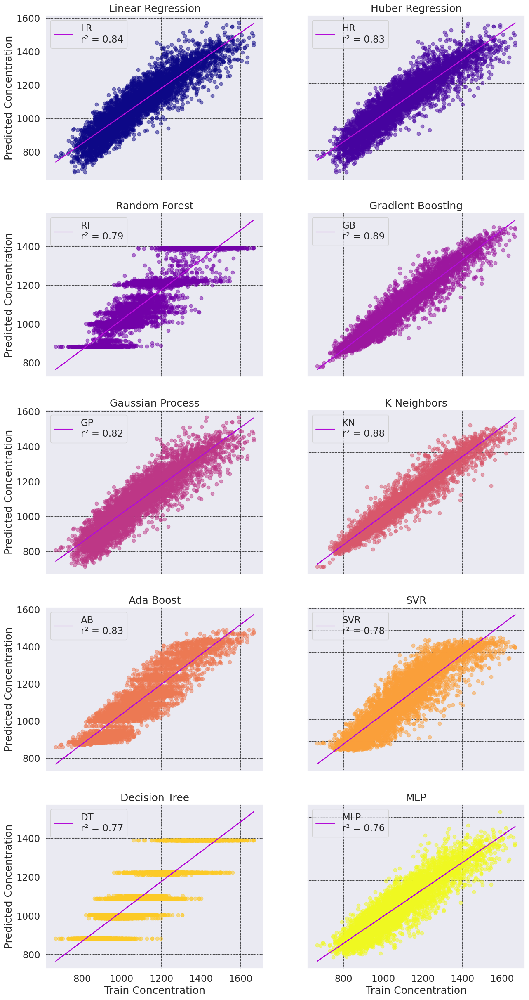

In [ ]:
plot_ML_model(0)

In [ ]:
score_df_results = pd.concat(all_model_results[1],
                        ignore_index=True).sort_values('Test R2',axis = 0, ascending = False)
score_df_results

In [ ]:
plot_ML_model(1)

In [ ]:
score_df_results = pd.concat(all_model_results[2],
                        ignore_index=True).sort_values('Test R2',axis = 0, ascending = False)
score_df_results

In [ ]:
plot_ML_model(2)

In [ ]:
score_df_results = pd.concat(all_model_results[3],
                        ignore_index=True).sort_values('Test R2',axis = 0, ascending = False)
score_df_results

,Method,Training MSE,Training R2,Test MSE,Test R2
3,Gradient Boosting,4753.745252,0.956053,5918.001902,0.946243
0,Linear Regression,8731.627758,0.919279,8424.730564,0.923473
1,Huber Regression,8850.12314,0.918184,8607.884545,0.92181
4,Gaussian Process,10527.7825,0.902674,10183.035349,0.907502
9,MLP,12230.820679,0.88693,13432.662415,0.877983
6,Ada Boost,15726.20278,0.854616,16421.873346,0.850831
2,Random Forest,20601.422582,0.809547,21687.130834,0.803003
5,K-Neighbors,17060.185669,0.842284,25372.644361,0.769525
8,Decision Tree,24029.213399,0.777858,25401.485512,0.769264
7,SVR,69935.028265,0.353474,70564.466973,0.359022


In [ ]:
plot_ML_model(3)

In [ ]:
score_df_results = pd.concat(all_model_results[4],
                        ignore_index=True).sort_values('Test R2',axis = 0, ascending = False)
score_df_results

In [ ]:
plot_ML_model(4)

In [ ]:
ini_params = gb.get_params()
ini_params

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [ ]:
y_predict  = ['PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)']

compound = y_predict[0]
#Designate independent and dependent variables
x  = df_final.drop([compound], axis = 1)
y  = df_final[compound]
#Split data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

#Initiate Different Regressors for ML model
gb = GradientBoostingRegressor(random_state=42)

#Setup values for parameters
grid_values = {
               'learning_rate':[0.05,0.1, 0.15],
               'n_estimators':[150, 200, 225],
               'max_depth': [5,6,7]
              }

grid_clf_acc = GridSearchCV(gb, param_grid = grid_values, scoring = 'r2', verbose=1)
grid_clf_acc.fit(X_train, y_train)

#Predict values based on new parameters
y_train_pred = grid_clf_acc.predict(X_train)
y_test_pred  = grid_clf_acc.predict(X_test)

# New Model Evaluation metrics
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print('r2 Score : ' + str(r2_score(y_test,y_test_pred)))

Fitting 5 folds for each of 27 candidates, totalling 135 fits
r2 Score : 0.9098901639476412


In [ ]:
#Make dataframe for grid search results
co_model = pd.DataFrame(['Gradient Boosting',train_mse, train_r2, test_mse, test_r2]).transpose()
co_model.columns = ['Method','Training MSE','Training R2','Test MSE','Test R2']
co_model

,Method,Training MSE,Training R2,Test MSE,Test R2
0,Gradient Boosting,650.420338,0.980188,3125.276223,0.90989


In [ ]:
fin_params = grid_clf_acc.best_params_
fin_params

{'learning_rate': 0.05, 'max_depth': 7, 'n_estimators': 225}

In [ ]:
optimized_GB_model = GradientBoostingRegressor(**grid_clf_acc.best_params_)

In [ ]:
# save model into pickle file
with open('air_quality.pkl','wb') as f:
    pickle.dump(optimized_GB_model,f)

# load model from pickle file
with open('air_quality.pkl', 'rb') as f:
    gb_model = pickle.load(f)

In [ ]:
optimized_GB_model.fit(X_train, y_train)
co_gb_predictions = optimized_GB_model.predict(X_test)
print('Regression Model: R²={:.2f}'.format(r2_score(y_test, co_gb_predictions)))

Regression Model: R²=0.91


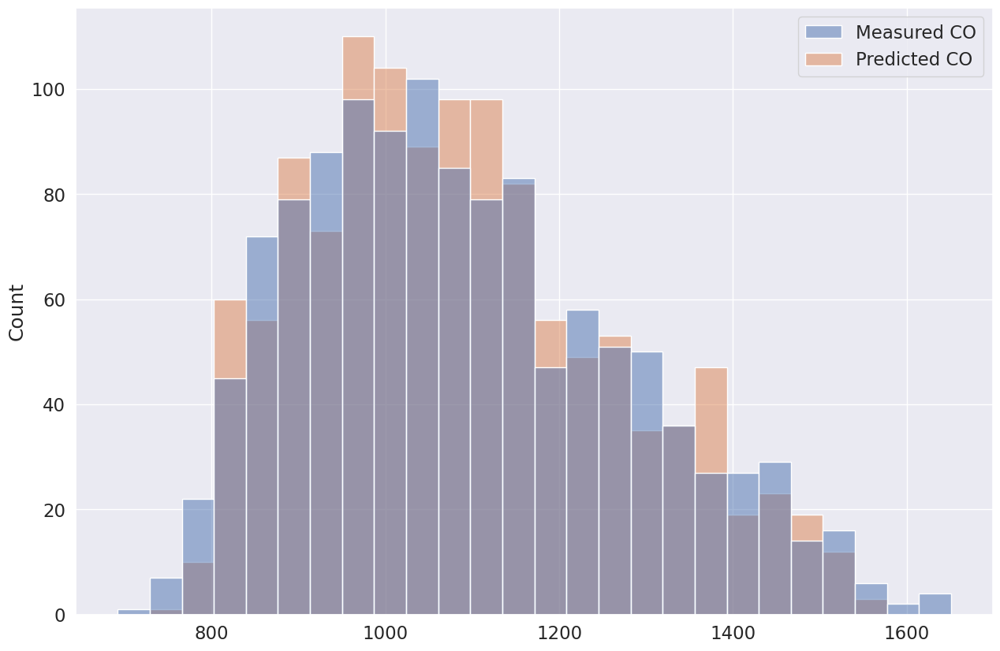

In [ ]:
final = pd.DataFrame()
final['Measured CO']   = y_test
final['Predicted CO']  = co_gb_predictions

plt.figure(figsize=(15,10))
sns.histplot(data=final)
plt.show()

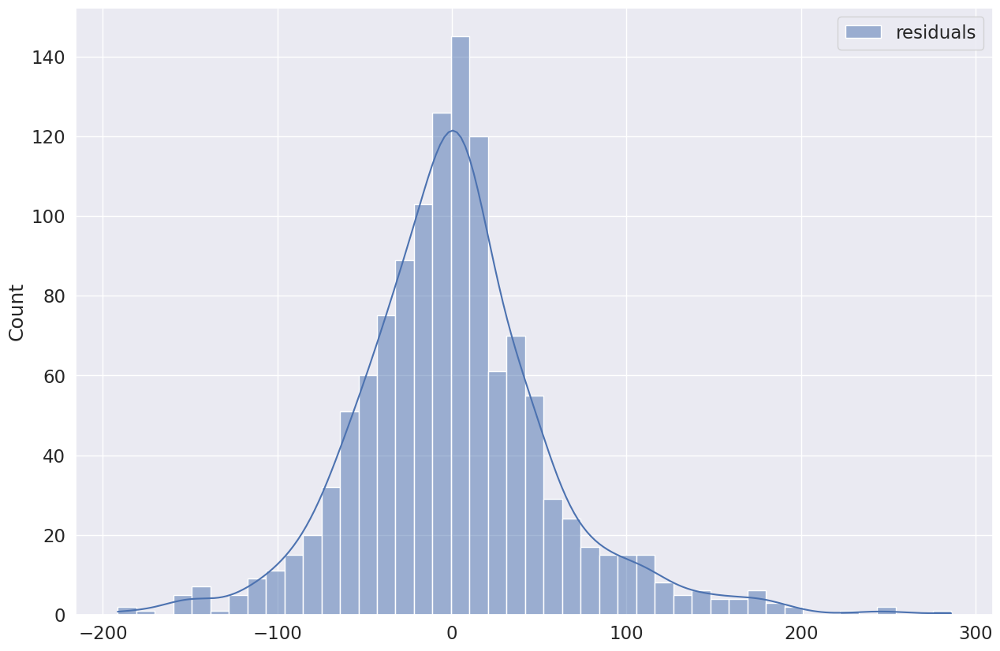

In [ ]:
plt.figure(figsize=(15,10))
res = pd.DataFrame()
res['residuals'] = final['Measured CO'] - final['Predicted CO']
sns.histplot(data=res, kde = True)
plt.show()

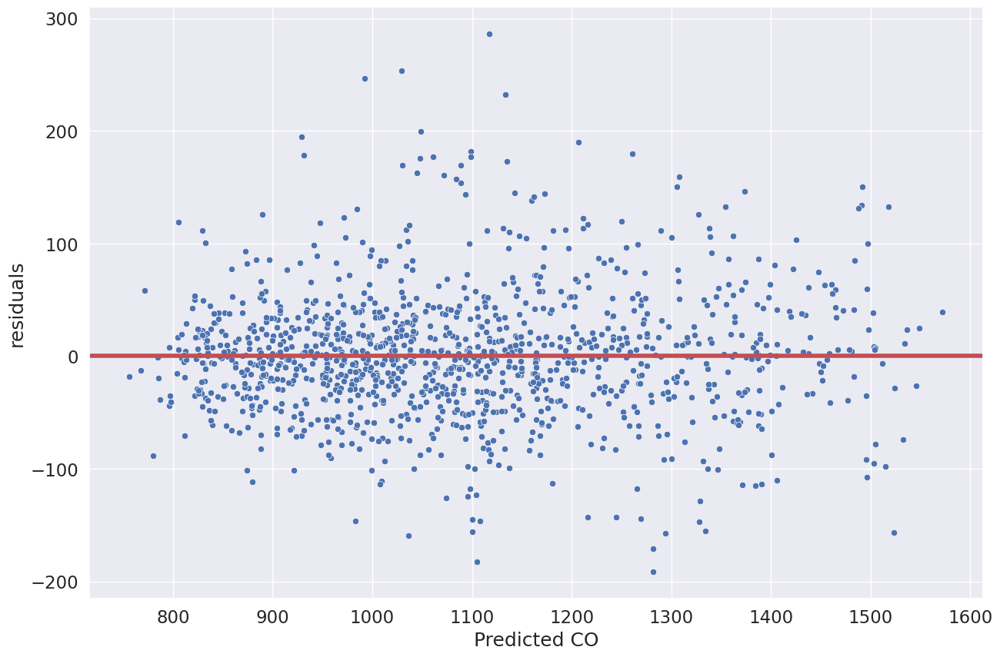

In [ ]:
plt.figure(figsize=(15,10))
sns.scatterplot(x= final['Predicted CO'], y=res['residuals'])
plt.axhline(y=0.0, color='r', linestyle='-', linewidth=4)
plt.show()

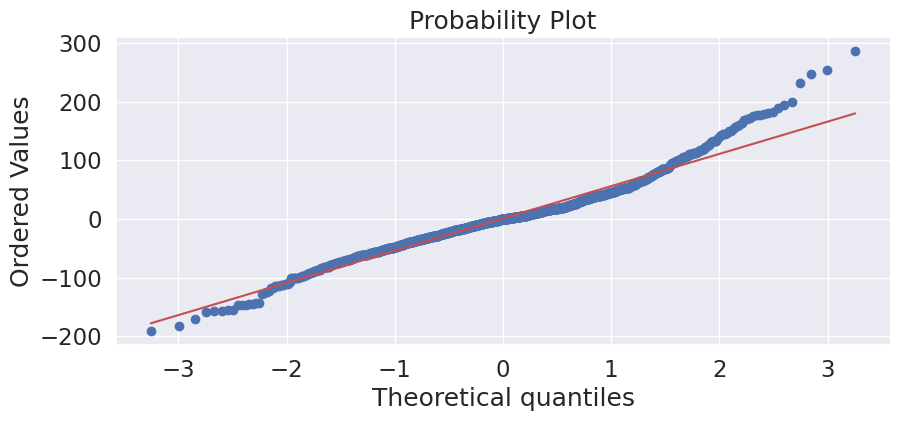

In [ ]:
fig = plt.figure(figsize = (10,4))
stats.probplot(res['residuals'], dist="norm", plot=plt)
plt.show()

In [ ]:
y_predict  = ['PT08.S1(CO)','PT08.S2(NMHC)','PT08.S3(NOx)','PT08.S4(NO2)','PT08.S5(O3)']

compound = y_predict[0]

#Designate independent and dependent variables
x  = df_final.drop([compound], axis = 1)
y  = df_final[compound]

#Predict concentration over entire dataset
optimized_GB_model.fit(x, y)
co_gb_pred_full = optimized_GB_model.predict(x)
print('Regression Model: R²={:.2f}'.format(r2_score(y, co_gb_pred_full)))

Regression Model: R²=0.98


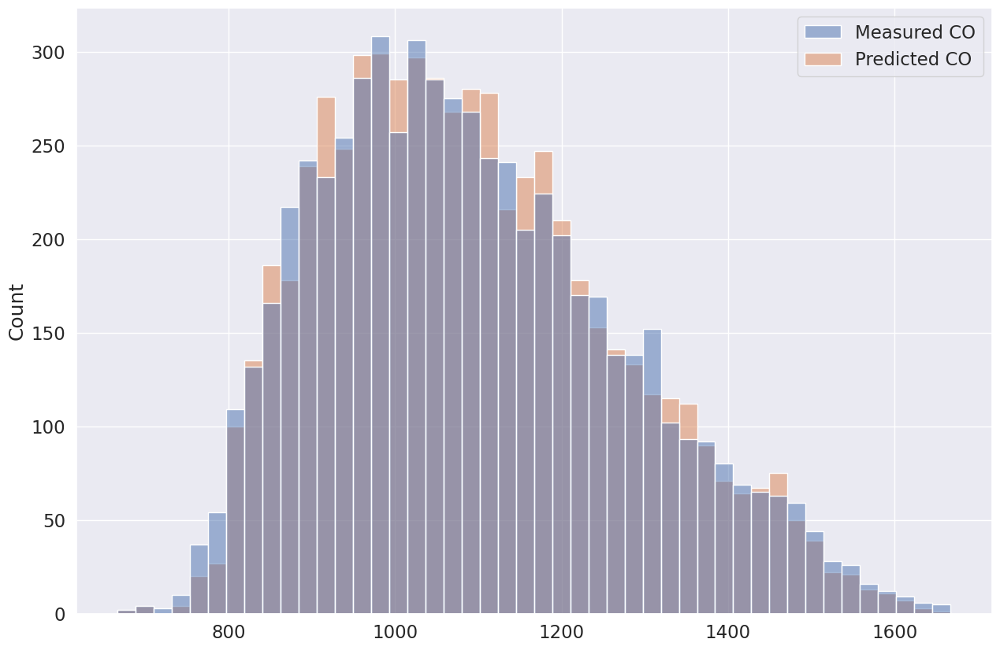

In [ ]:
full_final = pd.DataFrame()
full_final['Measured CO']  = y
full_final['Predicted CO'] = co_gb_pred_full

plt.figure(figsize=(15,10))
sns.histplot(data=full_final)
plt.show()

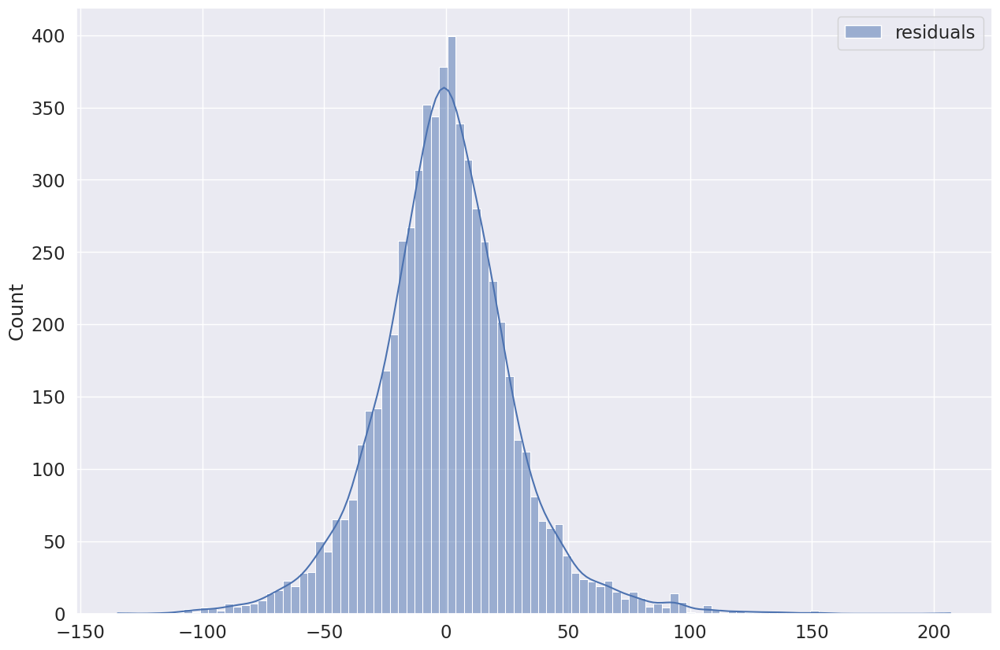

In [ ]:
plt.figure(figsize=(15,10))
res_final = pd.DataFrame()
res_final['residuals'] = full_final['Measured CO'] - full_final['Predicted CO']
sns.histplot(data=res_final, kde = True)
plt.show()

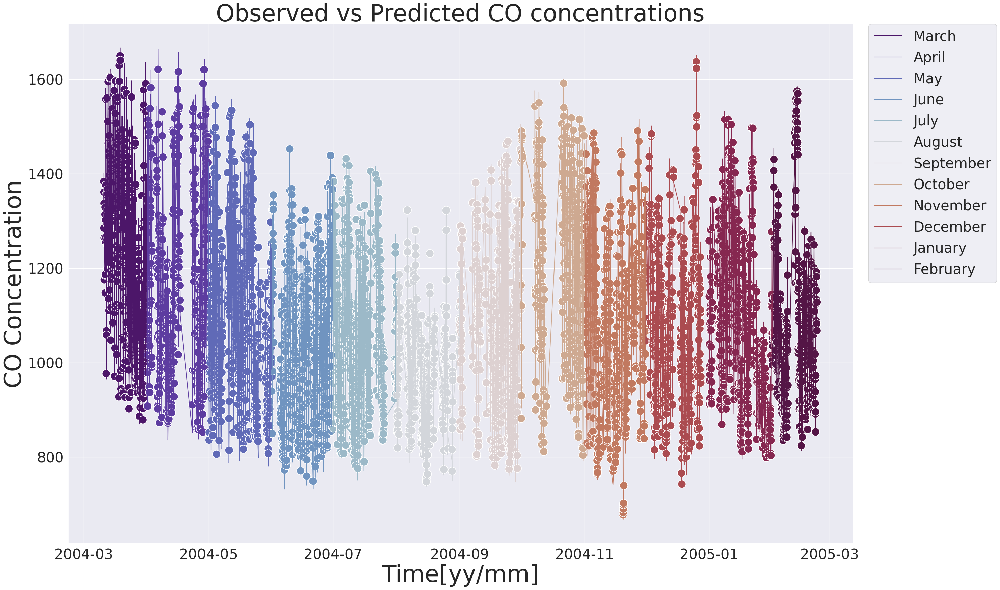

In [ ]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:70% !important; }</style>"))

plt.figure(figsize=(30,20))
maxRow = 5250
sns.scatterplot(x = df_filtered['DateTime'][:maxRow], y = full_final['Predicted CO'][:maxRow],
             hue = df_filtered['Month'], palette = 'twilight_shifted', legend = False,
             s=300)
sns.lineplot(x = df_filtered['DateTime'][:maxRow], y = full_final['Measured CO'][:maxRow],
             hue = df_filtered['Month'] , palette = 'twilight_shifted',
             legend = 'auto')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0 ,fontsize = 30)
plt.title('Observed vs Predicted CO concentrations', fontsize = 50)
plt.ylabel('CO Concentration', fontsize = 50)
plt.xlabel('Time[yy/mm]', fontsize = 50)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()